# Botify Grime - Playlist Song Recommendations

In addition to divvying up my playlist into smaller playlists, I wanted to find a way to invent my own form of recommendations for any given playlist. This has led to the creation of the Botify shootoff: Botify Grime.

## Web Scraping Tool for Music Genres

I want the recommendation engine to primarily play off of 2 things: genres and desired track features. To first tackle the genres we need to find an aggregate list of all possible Spotify genres. This information is unfortunately not given to us by Spotify, but it is given to us by Spotify's lead data engineer, Grant Macdonald. Grant Macdonald's site https://everynoise.com/ contains a mapped out version of every single possible Spotify genre, so we need to first scrape all possible visible information about these genres. 

This includes their name, their position on an x-y cartesian plane, their font-size, and their color represented as both a hex value and an rgb value. The font size and rgb values will be used later on in the code.

**Define a scraping function**: A function named `scrape_genres` is created, which takes a URL as an argument and performs the following tasks:
    - Sends an HTTP request to the URL and fetches the content.
    - Parses the HTML response using Beautiful Soup library.
    - Extracts relevant information about music genres from the page using appropriate selectors.
    - Pre-processes and cleans the data.
    - Converts the extracted data into a DataFrame using pandas.

**Clean and save data**: The scraped genre names are cleaned from unnecessary characters and the resulting DataFrame is saved as a CSV file. We then create a split-off dataframe called "enao_graph.csv" which will be used later on when we utilize the font size and rgb values.

In [37]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

def scrape_genres(url):
    try:
        response = requests.get(url)
        soup = BeautifulSoup(response.text, 'html.parser')

        genres_elems = soup.find_all("div", class_="genre")

        genres_objs = []

        for genre in genres_elems:
            style = genre['style']

            font_size = style.split('font-size:')[1].split(';')[0].strip()

            color_str = style.split('color:')[1].split(';')[0].strip()

            r, g, b = tuple(int(color_str[i:i + 2], 16) for i in (1, 3, 5))

            top = style.split('top:')[1].split(';')[0].strip()
            left = style.split('left:')[1].split(';')[0].strip()

            genre_obj = {
                "genre": genre.text.replace("»", "").strip(),
                "font_size": font_size,
                "color": color_str,
                "colors_rgb": f"rgb({r}, {g}, {b})",
                "top": top,
                "left": left
            }
            genres_objs.append(genre_obj)

        genres_df = pd.DataFrame(genres_objs)
        return genres_df

    except Exception as e:
        print(f"An error occurred while scraping genres: {e}")
        return None

url = "https://everynoise.com/engenremap.html"
genres_df = scrape_genres(url)

if genres_df is not None:
    genres_df.to_csv("enao_genres.csv", index=False)

genres_df.head()

,genre,font_size,color,colors_rgb,top,left
0,pop,160%,#ad8807,"rgb(173, 136, 7)",4850px,787px
1,rap,144%,#a88903,"rgb(168, 137, 3)",5759px,1070px
2,rock,141%,#ab711a,"rgb(171, 113, 26)",11449px,564px
3,urbano latino,134%,#bd9002,"rgb(189, 144, 2)",3341px,1170px
4,hip hop,134%,#ad7e09,"rgb(173, 126, 9)",6978px,1085px


In [38]:
genres_df = pd.read_csv("enao_genres.csv")

genres_df['color'] = genres_df['colors_rgb']

enao_graph = genres_df[['genre', 'color', 'font_size', 'left', 'top']]

enao_graph.to_csv("enao_graph.csv", index=False)

print(enao_graph)

                      genre              color font_size    left      top
0                       pop   rgb(173, 136, 7)      160%   787px   4850px
1                       rap   rgb(168, 137, 3)      144%  1070px   5759px
2                      rock  rgb(171, 113, 26)      141%   564px  11449px
3             urbano latino   rgb(189, 144, 2)      134%  1170px   3341px
4                   hip hop   rgb(173, 126, 9)      134%  1085px   6978px
...                     ...                ...       ...     ...      ...
6173     yunnan traditional   rgb(69, 154, 40)      100%   714px  17793px
6174  classical string trio  rgb(25, 173, 130)      100%   381px  21422px
6175         string quintet  rgb(69, 166, 181)      100%   494px  18809px
6176      quartetto d'archi   rgb(52, 164, 95)      100%   430px  18166px
6177        youth orchestra  rgb(38, 145, 172)      100%   175px  20806px

[6178 rows x 5 columns]


In [39]:
genres_df = pd.read_csv("enao_genres.csv")

genres_df['left'] = genres_df['left'].apply(lambda value: int(value.replace("px", "")))
genres_df['top'] = genres_df['top'].apply(lambda value: int(value.replace("px", "")))

genres_df = genres_df.rename(columns={'left': 'x', 'top': 'y'})

df = genres_df[['genre', 'color', 'x', 'y']]

print(df)

                      genre    color     x      y
0                       pop  #ad8807   787   4850
1                       rap  #a88903  1070   5759
2                      rock  #ab711a   564  11449
3             urbano latino  #bd9002  1170   3341
4                   hip hop  #ad7e09  1085   6978
...                     ...      ...   ...    ...
6173     yunnan traditional  #459a28   714  17793
6174  classical string trio  #19ad82   381  21422
6175         string quintet  #45a6b5   494  18809
6176      quartetto d'archi  #34a45f   430  18166
6177        youth orchestra  #2691ac   175  20806

[6178 rows x 4 columns]


### Genre Scatter Plot Visualization

Using the scraped data, we can plot our own little version of Every Noise's genre mapping using `plotly.express`

In [40]:
import pandas as pd
import plotly.express as px

fig = px.scatter(df,
                 x='x',
                 y='y',
                 color='color',
                 hover_name='genre',
                 title='Visual Mapping of Genres',
                 labels={'x': 'x',
                         'y': 'y'})

# Show the plot
fig.show()

### 3D Genre Map Visualization with Hue Rotation

To create a 3D plot, the y-axis is replaced with the rotated hue angle values. The `rotate_hue` function calculates the new hue angle after rotation, and the `hex_to_hsl` function converts the original hex color to HSL format. The list comprehension generates a list of hue angles for each genre based on the colors in the 'color' column of the DataFrame.

By adding this third dimension (hue angle) to the plot, we can visualize the genres in a 3D space, providing a more comprehensive representation of their relationships within the multidimensional space.

In [41]:
import plotly.graph_objs as go
import colorsys
import pandas as pd

def hex_to_hsl(hex_color):
    rgb = [int(hex_color[i:i+2], 16) / 255.0 for i in range(1, 6, 2)]
    hls = colorsys.rgb_to_hls(*rgb)
    return hls[0] * 360, hls[1], hls[2]

def genre_map_3d(df, hue_rotation, width):
    def rotate_hue(h):
        return (h + hue_rotation) % 360

    data = [
        go.Scatter3d(
            x=df['x'],
            y=[rotate_hue(hex_to_hsl(hex_color)[0]) for hex_color in df['color']],
            z=df['y'],
            hovertext=df['genre'],
            mode="markers",
            marker=dict(
                size=3,
                color=df['color'],
                opacity=1
            )
        )
    ]

    layout = go.Layout(
        scene=dict(
            xaxis=dict(title=dict(text="x")),
            yaxis=dict(title=dict(text="Hue angle (°)"), autorange="reversed"),
            zaxis=dict(title=dict(text="y")),
            camera=dict(eye=dict(x=-1.25, y=-1.25, z=1.25)),
        ),
        height=600,
        width=width,
        margin=dict(l=0, r=0, b=0, t=0),
    )

    fig = go.Figure(data=data, layout=layout)
    fig.show()

# Example dataframe
# Example usage
genre_map_3d(df, 30, 800)

### Combining and Visualizing Merged DataFrames

The code snippet expands and merges the playlist and genre DataFrames, resulting in a combined dataset. This dataset is then passed to the previously defined `genre_map_3d()` function, generating a 3D Genre Map visualization that displays the playlist's genre information in the same 3D space

In [42]:
playlist_df = pd.read_csv("features_df.csv")

expanded_genres = playlist_df['genres'].str.split(',', expand=True).stack().reset_index(level=1, drop=True).rename('genre')
expanded_df = playlist_df.drop(columns='genres').join(expanded_genres)

mapped_df = expanded_df.merge(df, on='genre', how='left')

mapped_df = mapped_df.dropna(subset=['x', 'y', 'color'])

genre_map_3d(mapped_df, 30, 800)

## In-Depth 'Every Noise' Web Scraping

Here we utilize a comprehensive solution for web scraping various pieces of additional pieces of information provided by Every Noise, such as artists, similar genres, opposite genres, and Spotify playlist links. This allows us to bring the information out of being solely visualization based and more in-line with generating track recommendations. The solution deals with handling errors during scraping, reading and updating an existing CSV file, and fetching and processing specific genre pages. The code is organized in a modular way, defining multiple functions that work together to achieve the desired outcome.

Here's an overview of the code's main components:

1. **Custom Exception Class**: `GenreProcessingError` is a user-defined exception class that inherits from Python's built-in exception class `Exception`. Creating custom exceptions is useful for handling specific types of errors and provides more detailed error messages. In this case, the `GenreProcessingError` is designed to handle errors related to genre processing.

2. **Functions**: The script consists of three main functions that demonstrate the modular nature of the code. By organizing code into separate functions, it becomes more readable, maintainable, and reusable.

    - `fetch_genre_page(subgenre)`: This function takes a subgenre string as input and fetches the corresponding genre page by constructing a URL based on the subgenre. The `requests` library is used to make an HTTP request to the server and obtain the page's HTML content. The function then returns a `BeautifulSoup` object, which represents the parsed HTML content, making it easier to navigate and extract data.

    - `process_genre(genre_div)`: This function accepts a genre div element extracted from a `BeautifulSoup` object. The main purpose of the function is to extract essential information such as artists, similar genres, opposite genres, playlist links, and weights for each genre. It processes the input element, stores the extracted information in a dictionary, and returns the result.

    - `process_genres_and_update_csv(filename)`: This function reads an existing CSV file and processes each genre row by calling the `process_genre()` function. As the new data is fetched, the corresponding rows in the CSV file are updated with the new information. The `pandas` library is used to read, update, and write the CSV file efficiently.

3. **Script Execution**: The script initiates by calling the `process_genres_and_update_csv()` function with an input filename (e.g., "all_genres1.csv"). This function updates the CSV file with the newly scraped genre information. The code also shows an alternative way to process specified genres by calling the `process_genre()` function and storing the processed genres in a list called `results`.

*The code's output is not shown below for the sake of brevity.*

In [ ]:
import sys
import re
import requests
from bs4 import BeautifulSoup
import csv
import pandas as pd

class GenreProcessingError(Exception):
    def __init__(self, message, genre, *args, **kwargs):
        super(GenreProcessingError, self).__init__(message, *args, **kwargs)
        self.genre = genre

def fetch_genre_page(subgenre):
    try:
        genre_page_url = f"http://everynoise.com/engenremap-{subgenre}.html"
        response = requests.get(genre_page_url)
        return BeautifulSoup(response.text, "html.parser")
    except requests.RequestException as request_err:
        raise GenreProcessingError("Error fetching genre page.", subgenre) from request_err

def process_genre(genre_div):
    genre = re.sub("[:'+»&\s-]", '', genre_div.text)
    soup2 = fetch_genre_page(genre)

    spotify_link = soup2.find_all("a", text='playlist')
    playlist = spotify_link[0]['href'] if len(spotify_link) > 0 else None

    all_artist_divs = set(soup2.find_all("div", "genre scanme"))
    all_genres_related = set(soup2.find_all("div", "genre")) - all_artist_divs

    artist_weights = [
        artist['style'].split()[-1].replace('%', '') for artist in all_artist_divs
    ]
    artists = [
        artist.text.strip().replace("»", "") for artist in all_artist_divs
        if not artist.text.strip().replace("»", "").isspace()
    ]

    sim_weights = [
        weight['style'].split()[-1].replace('%', '')
        for weight in all_genres_related if 'nearby' in weight['id']
    ]
    opp_weights = [
        weight['style'].split()[-1].replace('%', '')
        for weight in all_genres_related if 'mirror' in weight['id']
    ]

    sim_genres = [
        other_genre.text.strip().replace("»", "")
        for other_genre in all_genres_related if 'nearby' in other_genre['id']
    ]
    opp_genres = [
        other_genre.text.strip().replace("»", "")
        for other_genre in all_genres_related if 'mirror' in other_genre['id']
    ]

    return {
        'genre': genre,
        'playlist': playlist,
        'artist_weights': artist_weights,
        'artists': artists,
        'sim_weights': sim_weights,
        'opp_weights': opp_weights,
        'sim_genres': sim_genres,
        'opp_genres': opp_genres,
    }
    
def process_genres_and_update_csv(filename):
    df = pd.read_csv(filename)

    for idx, row in df.iterrows():
        if pd.isnull(row['SPOTIFY_URL']):
            genre_div = BeautifulSoup(f'<div>{row["GENRE"]}</div>', "html.parser")
            try:
                result = process_genre(genre_div)
                print(f"Processed genre #{idx}: {result['genre']}")

                df.at[idx, 'SIM_GENRES'] = ', '.join(result['sim_genres'])
                df.at[idx, 'SIM_WEIGHTS'] = ', '.join(result['sim_weights'])
                df.at[idx, 'OPP_GENRES'] = ', '.join(result['opp_genres'])
                df.at[idx, 'OPP_WEIGHTS'] = ', '.join(result['opp_weights'])
                df.at[idx, 'REL_ARTISTS'] = ', '.join(result['artists'])
                df.at[idx, 'ARTIST_WEIGHTS'] = ', '.join(result['artist_weights'])
                df.at[idx, 'SPOTIFY_URL'] = result['playlist']
            except GenreProcessingError as gpe:
                print(f"Error processing genre #{idx} ({gpe.genre}): {gpe}")

    df.to_csv(filename, index=False)

filename = "all_genres1.csv"
process_genres_and_update_csv(filename)

response = requests.get("http://everynoise.com/engenremap.html")
soup = BeautifulSoup(response.text, "html.parser")
all_genre_divs = soup.find_all("div", "genre scanme")

results = []

for index, genre_div in enumerate(all_genre_divs):
    genre = re.sub("[:'+»&\s-]", '', genre_div.text)

    if genre in genres_to_process:
        try:
            result = process_genre(genre_div)
            results.append(result)
            print(f"Processed genre #{index}: {result['genre']}")
        except GenreProcessingError as gpe:
            print(f"Error processing genre #{index} ({gpe.genre}): {gpe}")


## Extracting Track IDs from Every Noise Playlists

For use later on in our recommendation engine, we need to extract important information about each genre, which can be done using the playlist url's provided by Every Noise.

We first set up Spotify authentication by importing the necessary libraries, reading our configuration file containing Spotify API credentials, and setting up a Spotipy object with the required client ID and client secret.

To extract track IDs from a single playlist, the `get_track_ids_from_playlist` function is defined, which accepts the Spotify object and a playlist ID. It fetches the playlist's tracks through the Spotipy object and subsequently extracts the track IDs from the playlist.

Handling multiple playlists simultaneously requires the `get_track_ids_for_playlists` function, which processes the list of playlist URLs in parallel by employing the `ThreadPoolExecutor` to map the `process_playlist_url` function to each playlist URL. This concurrency speeds up the data extraction process for multiple playlists.

The `process_playlist_url` function, defined within `get_track_ids_for_playlists`, is responsible for extracting a playlist ID from its URL. Using this ID, the function retrieves track IDs and appends them to a shared dictionary. If the retrieval process encounters any issues, it retries once after a brief sleep period to allow for potential network hiccups or temporary API issues.

Once all playlists are processed, the code compiles a list of playlist URLs from the DataFrame, calls the `get_track_ids_for_playlists` function with the Spotify data object and the list of playlist URLs, and obtains a dictionary containing the corresponding `playlist_track_ids`.

The extracted track IDs are then stored in a JSON file, named `track_ids.json`, to be used for future analyses, eliminating the need to re-query them from the Spotify API.

In [28]:
import pandas as pd
from tqdm import tqdm
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth
from pprint import pprint
import requests
import concurrent.futures
import json
import configparser
from urllib.parse import quote
import time

config = configparser.ConfigParser()
config.read('config.ini')

USERNAME = config.get('SPOTIFY', 'username')
PASSWORD = config.get('SPOTIFY', 'password')
CLIENT_ID = config.get('SPOTIFY', 'client_id')
CLIENT_SECRET = config.get('SPOTIFY', 'client_secret')
REDIRECT_URI = config.get('SPOTIFY', 'redirect_uri')
SCOPE = config.get('SPOTIFY', 'scope')
SPOTIFY_API_KEY = config.get('SPOTIFY','spotify_api_key')

SPOTIFY_AUTH_URL = "https://accounts.spotify.com/authorize"
SPOTIFY_TOKEN_URL = "https://accounts.spotify.com/api/token"
SPOTIFY_API_BASE_URL = "https://api.spotify.com"
API_VERSION = "v1"
SPOTIFY_API_URL = "{}/{}".format(SPOTIFY_API_BASE_URL, API_VERSION)

client_credentials_manager = SpotifyClientCredentials(client_id=CLIENT_ID, client_secret=CLIENT_SECRET)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

In [5]:
import time
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor
import json

def get_track_ids_from_playlist(sp, playlist_id):

    results = sp.playlist_tracks(playlist_id)
    track_ids = [item['track']['id'] for item in results['items']]
    return track_ids


def get_track_ids_for_playlists(sp, playlists):
    track_ids_dict = {}

    try:
        with open('track_ids.json', 'r') as f:
            track_ids_dict = json.load(f)
    except FileNotFoundError:
        pass
    def process_playlist_url(playlist_url):
        nonlocal track_ids_dict

        if playlist_url is None:
            track_ids_dict[playlist_url] = None
        elif playlist_url not in track_ids_dict:
            playlist_id = playlist_url.split('playlist/')[1]

            success, retries = False, 0
            while not success and retries < 2:  # Attempt once and retry once
                try:
                    track_ids = get_track_ids_from_playlist(sp, playlist_id)
                    track_ids_dict[playlist_url] = track_ids
                    success = True
                except Exception as e:
                    sleep_time = 2 ** retries
                    time.sleep(sleep_time)
                    retries += 1

    with ThreadPoolExecutor() as executor:
        list(tqdm(executor.map(process_playlist_url, playlists), total=len(playlists), desc='Processing playlists'))

    with open('track_ids.json', 'w') as f:
        json.dump(track_ids_dict, f)

    return track_ids_dict

playlists = [url for url in df['SPOTIFY_URL'].tolist() if isinstance(url, str)]
playlist_track_ids = get_track_ids_for_playlists(sp, playlists)

Processing playlists: 100%|█████████████████| 6091/6091 [02:46<00:00, 36.65it/s]


## Retrieving Audio Features and Popularity for with Spotipy and RateLimiter

We now need to extract audio features and popularity of the tracks from all the Spotify playlists. We accomplish this using the Spotipy library while also implementing rate limiting to respect API request limits. The code comprises several functions and configurations to achieve this task.

First, the `get_track_popularity` function is defined, which accepts the Spotipy object and a list of track IDs. It sends a request to fetch the track information and extracts the popularity value for each track, storing it in a `track_popularity` dictionary.

Next, the `get_audio_features_for_tracks` function is created to process a dictionary of track IDs from playlists. It reads and stores any pre-existing audio features data from the `audio_features.json` file into `audio_features_dict`. A `RateLimiter` object is also set up to limit the number of requests per second to the Spotify API.

The `process_track_ids` function is defined within the main function to fetch audio features and popularity for each track ID. It splits the track IDs into batches and updates the popularity for already-processed batches. If a batch is unprocessed, it requests the audio features and popularity of the tracks while handling potential exceptions.

The `ThreadPoolExecutor` is used to execute the `process_track_ids` function concurrently, improving the efficiency of data extraction. Then, the extracted audio features data is saved into a JSON file named `audio_features.json`.

Finally, the `get_audio_features_for_tracks` function is called with the Spotipy object and the dictionary of playlist track IDs, returning the retrieved `audio_features` dictionary.


In [8]:
from ratelimiter import RateLimiter

def get_track_popularity(sp, track_ids):
    track_popularity = {}
    
    tracks = sp.tracks(track_ids)
    for track in tracks['tracks']:
        track_popularity[track['id']] = track['popularity']

    return track_popularity

def get_audio_features_for_tracks(sp, track_ids_dict):
    audio_features_dict = {}
        # Load existing audio features
    try:
        with open('audio_features.json', 'r') as f:
            audio_features_dict = json.load(f)
    except FileNotFoundError:
        pass
    
    rate_limiter = RateLimiter(max_calls=30, period=1)

    def process_track_ids(track_ids):
        nonlocal audio_features_dict
        batch_size = 50
    
        for i in range(0, len(track_ids), batch_size):
            batch = track_ids[i:i + batch_size]
        
        unprocessed_batch = [tid for tid in batch if tid not in audio_features_dict]
        processed_batch = [tid for tid in batch if tid in audio_features_dict]
        
        if unprocessed_batch:
            success, retries = False, 0
            while not success and retries < 10:  
                with rate_limiter:
                    try:
                        features = sp.audio_features(unprocessed_batch)
                        popularity = get_track_popularity(sp, unprocessed_batch)
                        
                        for feature in features:
                            feature['popularity'] = popularity[feature['id']]
                            audio_features_dict[feature['id']] = feature
                        
                        success = True
                    except Exception as e:
                        sleep_time = 2 ** retries
                        time.sleep(sleep_time)
                        retries += 1
        
        if processed_batch:
            popularity = get_track_popularity(sp, processed_batch)
                
            for tid in processed_batch:
                audio_features_dict[tid]['popularity'] = popularity[tid]
                
    with ThreadPoolExecutor(max_workers=6) as executor:
        track_ids_list = [ids for ids in track_ids_dict.values() if ids is not None]
        all_track_ids = [tid for ids in track_ids_list for tid in ids]
        chunks = [all_track_ids[i:i+50] for i in range(0, len(all_track_ids), 50)]
        list(tqdm(executor.map(process_track_ids, chunks), total=len(chunks), desc='Processing audio features'))
    with open('audio_features.json', 'w') as f:
        json.dump(audio_features_dict, f)

    return audio_features_dict

audio_features = get_audio_features_for_tracks(sp, playlist_track_ids)

Processing audio features:  26%|██▊        | 3069/11805 [05:25<15:25,  9.43it/s]

KeyboardInterrupt



## Averaging Audio Features for Genres

Now using the collected audio features, we need to average them out in order to understand the estimated features that define each genre.

Initially, the code creates an empty dictionary (`genre_track_ids`) that will later store the genres as keys and their corresponding track IDs as values. It iterates through the DataFrame `df`, grouping the track IDs from each playlist by their genres, effectively aggregating the tracks on a genre-level.

Once the tracks are grouped by genres, the code calculates the average audio features for each genre. To do this, it initializes an empty dictionary called `genre_audio_features_avg`. This dictionary will store the final results for each genre, consisting of their average audio features and popularity values.

Iterating through the `genre_track_ids` dictionary, the code constructs a list of audio features for each genre by mapping the track IDs to their respective audio features, which have been previously collected. If this list is non-empty, the code converts it into a pandas DataFrame and computes the mean of the audio features using the `mean()` function, with the `numeric_only=True` parameter to only calculate the mean for numeric columns.

By doing so, the code obtains the average values for audio features and popularity for each genre in the dataset. Each genre's averaged results are then stored in the `genre_audio_features_avg` dictionary. If no audio features exist for a genre, the code assigns a value of `None` in the dictionary for that genre.

In conclusion, the code performs an effective and structured computation of the average audio features and popularity values for genres among multiple Spotify playlists. These values offer a compact representation of each genre's audio characteristics, facilitating further analysis and comparisons across different genres.


In [ ]:
import pandas as pd
import numpy as np
from tqdm import tqdm

genre_track_ids = {}
for index, row in df.iterrows():
    genre = row['GENRE']
    playlist_url = row['SPOTIFY_URL']
    track_ids = playlist_track_ids.get(playlist_url, [])
    if track_ids is not None:
        if genre not in genre_track_ids:
            genre_track_ids[genre] = []
        genre_track_ids[genre].extend(track_ids)

# Calculate the average of each audio feature for the tracks in each genre
genre_audio_features_avg = {}
for genre, track_ids in tqdm(genre_track_ids.items(), desc='Processing genres'):
    features_list = [audio_features[tid] for tid in track_ids if tid in audio_features]
    if features_list:
        features_df = pd.DataFrame(features_list)
        features_mean = features_df.mean(numeric_only=True)
        genre_audio_features_avg[genre] = features_mean.to_dict()
    else:
        genre_audio_features_avg[genre] = None

In [15]:
import pandas as pd
import numpy as np


valid_genres = [genre for genre, features in genre_audio_features_avg.items() if features is not None]
filtered_df = df[df['GENRE'].isin(valid_genres)].copy()

numeric_features = features_df.select_dtypes(include=np.number).columns
for feature_name in numeric_features:
    filtered_df[f'{feature_name}'] = filtered_df['GENRE'].apply(lambda genre: genre_audio_features_avg[genre][feature_name])

filtered_df.to_csv("avg_genres.csv", index=False)

## Detailed Analysis and Visualization of Genre Clusters and Audio Feature Averages

The purpose of this code is to perform a detailed analysis and visualization of music genre clusters and their associated audio feature averages. The code achieves this through a series of interconnected steps, including data preprocessing, scatter plot creation, clustering assignment, visualization of genre clusters, and computing average audio feature values for each cluster. The analysis enables users to explore the relationships between genres, evaluate similarities and differences, and provide insights into the genre characteristics.<br><br>

1. **Defining the `create_scatter_plot` function**: This function takes a dataset and plot title as input arguments and produces a scatter plot with genres mapped on the x-y plane. The x-axis represents a spectrum between more atmospheric and more bouncy genres, while the y-axis ranges from more organic to more mechanical genres. The function plots a Seaborn scatterplot using the given data and color assignments. It also adds labels for a pre-specified set of genres on the graph, configures the plot axes and title, inverts the y-axis for clearer visualization, and displays the plot.<br><br>
  
2. **Reading and preprocessing data**: The code reads two separate data files, 'enao_graph.csv' and 'features_df.csv', and pre-processes their information. The 'enao_graph.csv' file contains information about genres, their positions, colors, and font sizes. The 'features_df.csv' file holds data about playlists with genres and their associated audio features. Both datasets are preprocessed by normalizing x and y values using MinMaxScaler, transforming color formats, and extracting required columns for further analysis.<br><br>
  
3. **Visualizing genres on the Spotify mapping**: After preprocessing the genre data, the `create_scatter_plot` function is called to visualize these genres on the Spotify mapping. This scatter plot shows the position of all distinct Spotify genres, with specified labeled parent genres displayed within clusters.<br><br>
  
4. **Expanding playlist dataset for unique genre categories**: To prepare the playlist dataset for merging and visualization, the 'features_df.csv' file is filtered for non-empty genre records. The genres column is split into separate unique genre categories using the `explode` function, which creates a dataset that maps individual genres to the corresponding playlist tracks.<br><br>
  
5. **Merging playlist data with the enao data**: The expanded playlist dataset is merged with the enao dataset (from 'enao_graph.csv') based on the 'genre' column. This results in a combined dataset called 'merged_data', which contains playlist genres, their associated audio features, positions, and visual attributes.<br><br>
  
6. **Visualizing merged playlist data on the Spotify mapping**: The code creates a scatter plot to visualize the merged playlist data on the same x-y plane used for the Spotify genre mapping. This plot allows for a direct comparison between the selected playlist genres and the genres within the overall Spotify landscape.<br><br>
  
7. **Calculating distances and assigning clusters**: The code defines an `euclidean_distance` function to compute the Euclidean distance between two points. Using this function, the distance between each point in the 'selected_enao' dataset (from the Spotify genre mapping) and the labeled parent genres is calculated. Each genre datapoint is assigned to the closest labeled parent genre, resulting in a new column called 'cluster'.<br><br>
    Euclidean distance is a measure of the straight-line distance between two points in Euclidean space. It calculates the distance between two n-dimensional points A (a₁, a₂, ..., aₙ) and B (b₁, b₂, ..., bₙ) using the equation:

   ```
   d(A, B) = √(Σᵢ (aᵢ - bᵢ)²), for i = 1 to n
   ```

   It is widely used for measuring similarity between data points. However, alternative metrics like Manhattan distance or cosine similarity can be considered for specific cases.<br><br>
   
8. **Visualizing genre clusters**: Using unique colors, a scatter plot is created to group the genres into clusters. The labeled parent genres are shown on the plot with white backgrounds for improved readability. This visualization highlights the relationships and distinctions between clustered genres based on their similar audio features.<br><br>
  
9. **Computing average audio feature values for clusters**: The 'selected_enao' dataset, which contains cluster assignments, is merged with the original 'data' dataset that contains genre-related audio features. The average audio feature values are calculated for each genre cluster, and the results are stored in the 'cluster_average_features' DataFrame.<br><br>
  
10. **Displaying cluster centroids and average feature values**: The resulting 'cluster_average_features' DataFrame lists each cluster centroid (parent genres) along with its corresponding average audio feature values. This comprehensive summary provides a detailed understanding of each genre cluster's musical characteristics, giving a solid basis for in-depth analysis and interpretation.


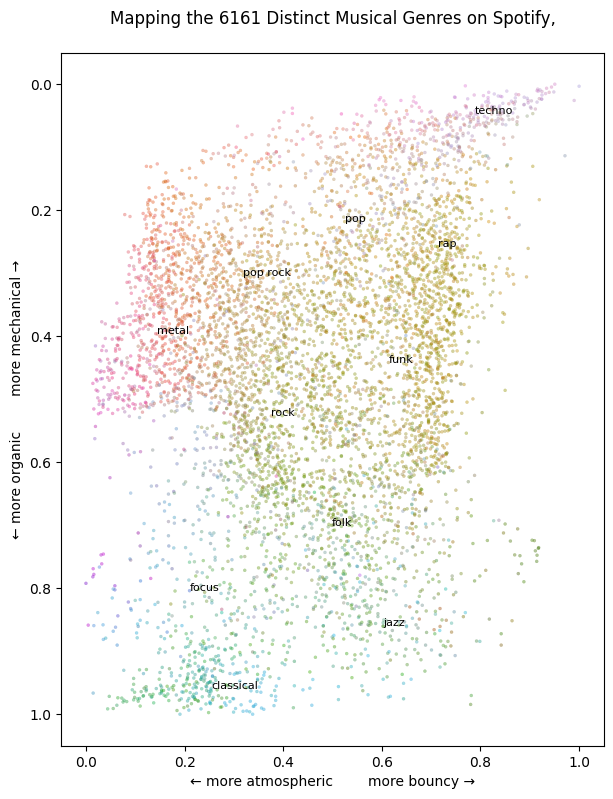

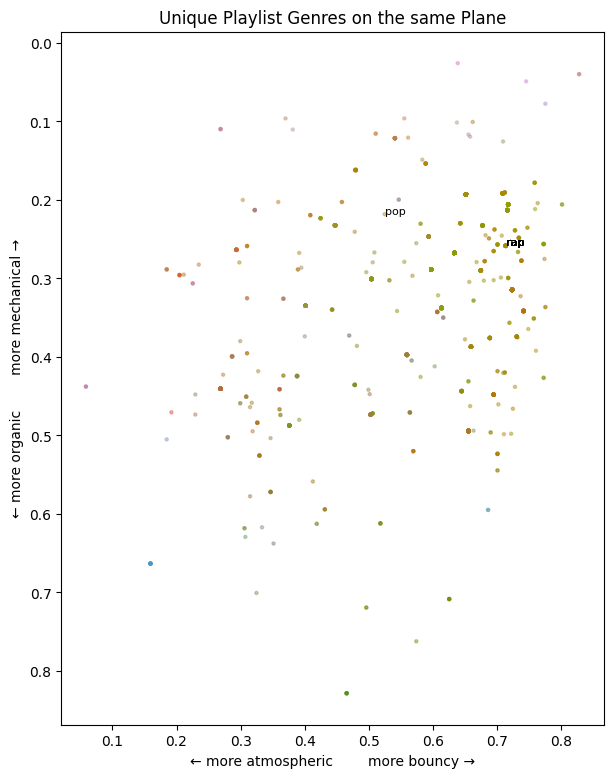

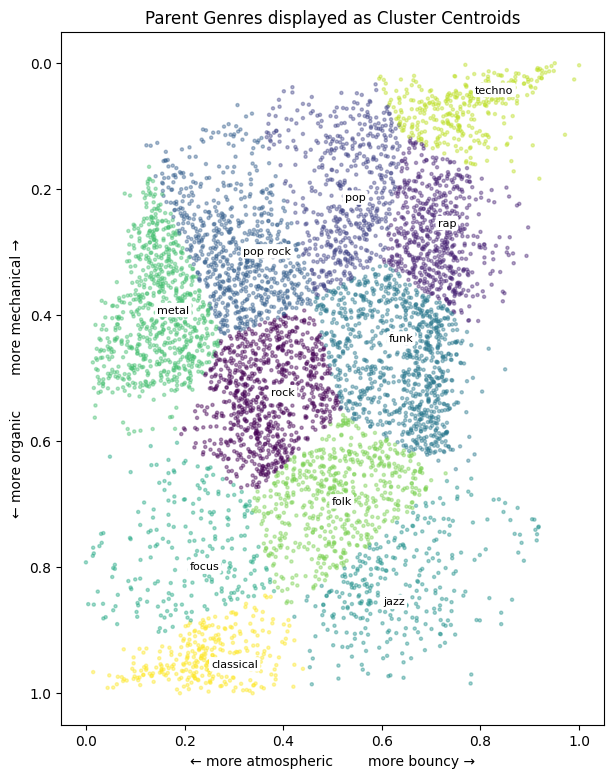

,cluster_name,danceability,energy,key,mode,loudness,liveness,speechiness,acousticness,instrumentalness,valence,tempo,time_signature
0,rock,0.514328,0.571577,5.232563,0.683387,-9.194510,0.186441,0.053367,0.373361,0.165249,0.468150,121.625909,3.881404
1,rap,0.726660,0.653825,5.424918,0.537899,-7.627332,0.175790,0.150779,0.235586,0.071881,0.587986,121.230331,3.978006
2,pop,0.619228,0.721724,5.367366,0.569265,-7.273153,0.196571,0.075010,0.185341,0.219561,0.504339,126.876020,3.957070
3,pop rock,0.505332,0.751019,5.337628,0.644359,-6.759692,0.200557,0.064284,0.145079,0.144414,0.478098,128.659863,3.943759
4,funk,0.663443,0.625277,5.358117,0.596341,-8.198260,0.181769,0.117377,0.367142,0.076347,0.629963,119.775582,3.893258
5,jazz,0.550349,0.344087,5.118756,0.685035,-14.305447,0.212364,0.189669,0.796859,0.339704,0.534094,113.075549,3.760160
6,focus,0.331941,0.306911,4.975790,0.649005,-17.144856,0.186372,0.065677,0.737767,0.590312,0.245744,107.533687,3.724647
7,metal,0.358209,0.832417,5.296676,0.626721,-6.552993,0.224121,0.084712,0.058208,0.341393,0.298757,126.984561,3.883732
8,folk,0.540885,0.463688,5.173792,0.671722,-11.230435,0.189666,0.069790,0.624869,0.242565,0.568838,117.822266,3.789748
9,techno,0.714764,0.750461,5.604626,0.540528,-8.248362,0.173021,0.085216,0.077328,0.537798,0.454211,129.477237,3.978701


In [77]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
import re
from matplotlib.colors import LinearSegmentedColormap
import warnings

warnings.filterwarnings('ignore')

def create_scatter_plot(data, plot_title):
    plt.figure(figsize=(7, 9))
    plot = sns.scatterplot(x='x_norm', y='y_norm', c=enao['color'].tolist(), data=data,
                           legend=None, edgecolor=None, alpha=0.4, s=5)

    for _, row in data.iterrows():
        if row['genre'] in genres_to_label:
            plot.text(row['x_norm'], row['y_norm'], row['genre'], fontsize=8, color='black')

    plot.set(xlabel='← more atmospheric        more bouncy →',
             ylabel='← more organic        more mechanical →')
    plot.set(title=plot_title)

    plot.invert_yaxis()

    plt.show()

def euclidean_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)

enao = pd.read_csv("enao_graph.csv")
playlist_df = pd.read_csv("features_df.csv")

enao['left'] = pd.to_numeric(enao['left'].str.replace('px', ''))
enao['top'] = pd.to_numeric(enao['top'].str.replace('px', ''))
enao[['r', 'g', 'b']] = enao['color'].apply(lambda x: tuple(map(int, re.findall(r'\d+', x)))).apply(pd.Series) 
enao['color'] = enao.apply(lambda row: (row.r/255, row.g/255, row.b/255), axis=1)

scaler = MinMaxScaler()
enao[['x_norm', 'y_norm']] = scaler.fit_transform(enao[['left', 'top']])

selected_enao = enao[['genre', 'x_norm', 'y_norm', 'color']]
color_map = LinearSegmentedColormap.from_list("", selected_enao['color'])
genres_to_label = ['rock', 'rap', 'pop', 'pop rock', 'funk', 'jazz', 'focus', 'metal',
                   'folk', 'techno', 'classical']

plot_title = f"Mapping the {len(selected_enao)} Distinct Musical Genres on Spotify,\n"
create_scatter_plot(selected_enao, plot_title)

playlist_df = playlist_df[playlist_df['genres'].notnull() & (playlist_df['genres'].str.strip() != '')]

playlist_df['genres'] = playlist_df['genres'].str.split(',')
playlist_df = playlist_df.explode('genres').reset_index(drop=True)

merged_data = playlist_df.merge(enao[['genre', 'x_norm', 'y_norm', 'color']],
                                left_on='genres', right_on='genre', how='left').dropna()

plt.figure(figsize=(7, 9))
plt.scatter(merged_data['x_norm'], merged_data['y_norm'], c=merged_data['color'], s=5, alpha=0.4)

genres_to_label = ['rock', 'rap', 'pop', 'pop rock', 'funk', 'jazz', 'focus', 'metal', 'folk', 'techno', 'classical']
for _, row in merged_data.iterrows():
    if row['genre'] in genres_to_label:
        plt.text(row['x_norm'], row['y_norm'], row['genre'], fontsize=8, color='black')

plt.xlabel('← more atmospheric        more bouncy →')
plt.ylabel('← more organic        more mechanical →')

plt.gca().invert_yaxis()
plt.title("Unique Playlist Genres on the same Plane")
plt.show()

selected_enao['cluster'] = -1
labeled_genres = selected_enao[selected_enao['genre'].isin(genres_to_label)]

for idx, genre in selected_enao.iterrows():
    min_distance = float('inf')
    closest_label = -1
    
    for _, label in labeled_genres.iterrows():
        distance = euclidean_distance(genre['x_norm'], genre['y_norm'], label['x_norm'], label['y_norm'])
        
        if distance < min_distance:
            min_distance = distance
            closest_label = label['genre']
    
    selected_enao.loc[idx, 'cluster'] = closest_label

genre_to_cluster = {g: i for i, g in enumerate(genres_to_label)}
selected_enao['cluster'] = selected_enao['cluster'].map(genre_to_cluster)

fig, ax = plt.subplots(figsize=(7, 9))
scatter = ax.scatter(x='x_norm', y='y_norm', c='cluster', cmap='viridis', data=selected_enao, s=5, alpha=0.4)
plt.gca().invert_yaxis()

for _, row in selected_enao.iterrows():
    if row['genre'] in genres_to_label:
        ax.text(row['x_norm'], row['y_norm'], row['genre'], fontsize=8, color='black', bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.2'))

ax.set(xlabel='← more atmospheric        more bouncy →',
       ylabel='← more organic        more mechanical →')

ax.set_title("Parent Genres displayed as Cluster Centroids")

plt.show()

combined_df = selected_enao.merge(data, on='genre', how='left')

cluster_to_genre = {v: k for k, v in genre_to_cluster.items()}


features_columns = [
    col for col in combined_df.columns if col not in ["cluster", "genre", "x_norm", "y_norm", "color"]
cluster_average_features = combined_df.groupby("cluster")[features_columns].mean()
cluster_average_features.reset_index(drop=True, inplace=True)

cluster_average_features["cluster_name"] = cluster_average_features.index.map(cluster_to_genre)

new_columns = ['cluster_name'] + features_columns

cluster_average_features = cluster_average_features[new_columns]

cluster_average_features.head(10)

## Genre Weight Calculation from Playlist with Similar Genres and Feature Similarity

Here we create individual genre weights by considering the playlist, genre features, and prevalence of similar genres related to their primary genres.<br><br>

1. **Reading necessary data**: The code reads two data files - 'enao_graph.csv' (containing information about genres, their positions, colors, and font sizes) and 'features_df.csv' (containing data about playlists with genres and their associated audio features). Additionally, it defines the list of audio features to be used throughout the analysis.<br><br>

2. **Creating data structures**: DataFrames and dictionaries are created to hold information like genres and their audio features, genre prevalence, cleaned genres formed by exploding and filtering the playlist genre data, and unique main genres in the playlist.<br><br>

3. **Calculating the mode for each feature in the playlist**: To find the most frequent value of each audio feature in the user's playlist, the 'calculate_mode_features' function is defined, which computes the mode of each audio feature.<br><br>

4. **Filtering common genres**: The 'df_common_genres' DataFrame is created, retaining only the genres that exist in both the playlist 'features_df' and the average audio features 'avg_genres.csv' files.<br><br>

5. **Calculating similarity between genre features and playlist features**: Cosine similarity is computed for each genre's features in the 'df_common_genres' DataFrame compared with the mode features of the playlist, essentially measuring the distance between each genre's features and the playlist's features in the high-dimensional space. The resulting similarities are stored in a new 'similarity' column.<br><br>

6. **Calculating and combining the prevalence of similar genres**: For every similar genre in the 'features_df' file, the code calculates its prevalence by considering both the original and similar genre occurrences. The final genre prevalence combines the prevalence of original genres with that of similar genres.<br><br>

7. **Defining factors for genre weights**: The code defines three factors for weight calculation: original_genre_factor (reflects user preference for the original genre), similar_genre_factor (emphasizes the importance of associated similar genres), and similarity_factor (accounts for the similarity between genre features and playlist features). The sum of these factors equals 1, ensuring a balanced weighted combination.<br><br>

8. **Calculating final genre weights**: Using the previously defined factors, the code calculates the final genre weights by a linear combination of the original genre prevalence, the prevalence of similar genres, and the similarity weights.<br><br>

9. **Sorting genres by weights**: The genres are sorted based on their final computed weights in descending order, resulting in a dictionary, 'sorted_genre_weights', containing genres and their corresponding weights. This output provides a ranked list of genres tailored to the user's playlist based on their preferences, similar genre prevalence, and genre features similarity with the playlist.<br><br>

In [78]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from scipy import stats
import numpy as np

df = pd.read_csv("avg_genres.csv")

playlist_df = pd.read_csv("features_df.csv")
playlist_genres = [genre for genres in playlist_df['genres'] for genre in str(genres).split(',')]
cleaned_genres = [genre.replace('/', '').replace('[', '').replace(']', '').replace('"', '').replace("'", '').strip() for genre in playlist_genres]
cleaned_genres = [genre for genre in cleaned_genres if genre in df['GENRE'].tolist()]
unique_main_genres = set(cleaned_genres)

genres_dict = df.set_index("GENRE")["SIM_GENRES"].to_dict()

def similar_genres_to_list(similar_genres_str):
    cleaned_str = (
        similar_genres_str.replace('[', '')
        .replace(']', '')
        .replace('"', '')
        .replace("'", '')
        .strip()
    )
 
    similar_genres = cleaned_str.split(',')
    return [genre.strip() for genre in similar_genres]


all_similar_genres = {main_genre: similar_genres_to_list(similar_genres) for main_genre, similar_genres in genres_dict.items()}

genre_prevalence = pd.Series(cleaned_genres).value_counts()
total_prevalence = sum(genre_prevalence.tolist())
normalized_genre_prevalence = {genre: value / total_prevalence for genre, value in genre_prevalence.items()}

def calculate_mode_features(df, features):
    mode_result = {}
    for feature in features:
        mode = stats.mode(df[feature])
        mode_result[feature] = mode.mode[0] if len(mode.count) > 0 else np.nan
    return mode_result

features = ['danceability', 'energy', 'key', 'mode', 'loudness', 'liveness', 'speechiness', 'acousticness', 'instrumentalness', 'valence', 'tempo', 'time_signature']
playlist_mode_features = calculate_mode_features(playlist_df, features)

df_common_genres = df[df["GENRE"].isin(genre_prevalence.keys())]

df_common_genres['similarity'] = df_common_genres[features].apply(
    lambda x: cosine_similarity([x], [list(playlist_mode_features.values())])[0][0], axis=1
)

similar_genres_prevalence = {}
for main_genre in unique_main_genres:
    similar_genres_list = all_similar_genres[main_genre]
    for similar_genre in similar_genres_list:
        similar_genres_prevalence[similar_genre] = similar_genres_prevalence.get(similar_genre, 0) + 1
        
final_genre_prevalence = genre_prevalence.copy()
for genre, prevalence in similar_genres_prevalence.items():
    final_genre_prevalence[genre] = final_genre_prevalence.get(genre, 0) + prevalence

original_genre_factor = 0.6
similar_genre_factor = 0.25
similarity_factor = 0.15 

total_final_prevalence = sum(final_genre_prevalence.tolist())
normalized_final_prevalence = {genre: value / total_final_prevalence for genre, value in final_genre_prevalence.items()}

total_similar_prevalence = sum(similar_genres_prevalence.values())
normalized_similar_prevalence = {genre: value / total_similar_prevalence for genre, value in similar_genres_prevalence.items()}

total_similarity_weights = sum(df_common_genres['similarity'].tolist())
normalized_similarity_weights = {genre: value / total_similarity_weights for genre, value in df_common_genres[['GENRE', 'similarity']].values}

adjusted_genre_weights = {}
for genre in genre_prevalence.index:
    original_weight = original_genre_factor * normalized_final_prevalence.get(genre, 0)
    similar_weight = similar_genre_factor * normalized_similar_prevalence.get(genre, 0)
    similarity_weight = similarity_factor * normalized_similarity_weights.get(genre, 0)

    adjusted_genre_weights[genre] = original_weight + similar_weight + similarity_weight

sorted_genre_weights = dict(sorted(adjusted_genre_weights.items(), key=lambda item: item[1], reverse=True))
sorted_genre_weights

{'rap': 0.027696915527942113,
 'underground hip hop': 0.026897223014771782,
 'hip hop': 0.019599413231294455,
 'vapor trap': 0.014525900314542208,
 'trap': 0.010688784467408162,
 'dark trap': 0.009147908454904903,
 'alternative hip hop': 0.008455999362671584,
 'plugg': 0.008039504762408793,
 'pluggnb': 0.007025664325277389,
 'melodic rap': 0.005303043265259665,
 'emo rap': 0.00501629780370966,
 'rock': 0.004671676964968901,
 'southern hip hop': 0.004567090493619454,
 'atl hip hop': 0.004539870944342969,
 'psychedelic hip hop': 0.004262073510399586,
 'alternative rock': 0.003917385871820871,
 'east coast hip hop': 0.0038717889755047067,
 'pop rap': 0.003827769264499925,
 'new orleans rap': 0.0037462861774626727,
 'experimental hip hop': 0.003744666214060812,
 'indie rock': 0.003724443718493059,
 'glitchcore': 0.0033673297904365193,
 'conscious hip hop': 0.0032367573230610725,
 'miami hip hop': 0.0031639551528101825,
 'gangster rap': 0.00314014477275242,
 'escape room': 0.003120075294082

## Visualizing Weighted Playlist Genres with Cosine Similarity Clustering

Here, we aim to visualize the weighted playlist genre positions within the Spotify mapping by using clustering techniques, particularly cosine similarity clustering.

First, the code redefines the `euclidean_distance` function to compute the Euclidean distance between two points, which will be useful for calculating the distances between genre points and cluster centroids.

**Cosine similarity** is a metric used to measure how similar two vectors are in an n-dimensional space. It is the cosine of the angle between them and ranges from -1 (completely dissimilar) to 1 (identical). For two vectors A and B, the cosine similarity is defined as the dot product of A and B divided by the product of their magnitudes:

* _cosine_similarity(A, B) = (A · B) / (||A|| ||B||)_

In the context of this code block, cosine similarity is used for clustering genres based on their audio features.

After calculating the cluster centroids by averaging the coordinates of the parent genres, each emphasized genre is assigned to the cluster with the centroid closest in terms of cosine similarity. This involves iterating through the emphasized genres, finding the nearest centroid for each point, and assigning it to the appropriate cluster.

The `create_scatter_plot` function is modified to accept an additional parameter, `emphasis_genres`, representing a list of emphasized genres to be highlighted in the visualization. The function plots the dataset genre points along with the emphasized genre points and cluster centroids, showing these genres on the Spotify mapping.

The resulting scatter plot displays the genres within the Spotify mapping and their respective cluster centroids based on cosine similarity clustering, illustrating the relationship between the playlist genres and the overall Spotify genre landscape. The comprehensive visualization allows users to observe relationships between the genres in their playlist and the wider genre landscape, while emphasizing genres of particular importance.

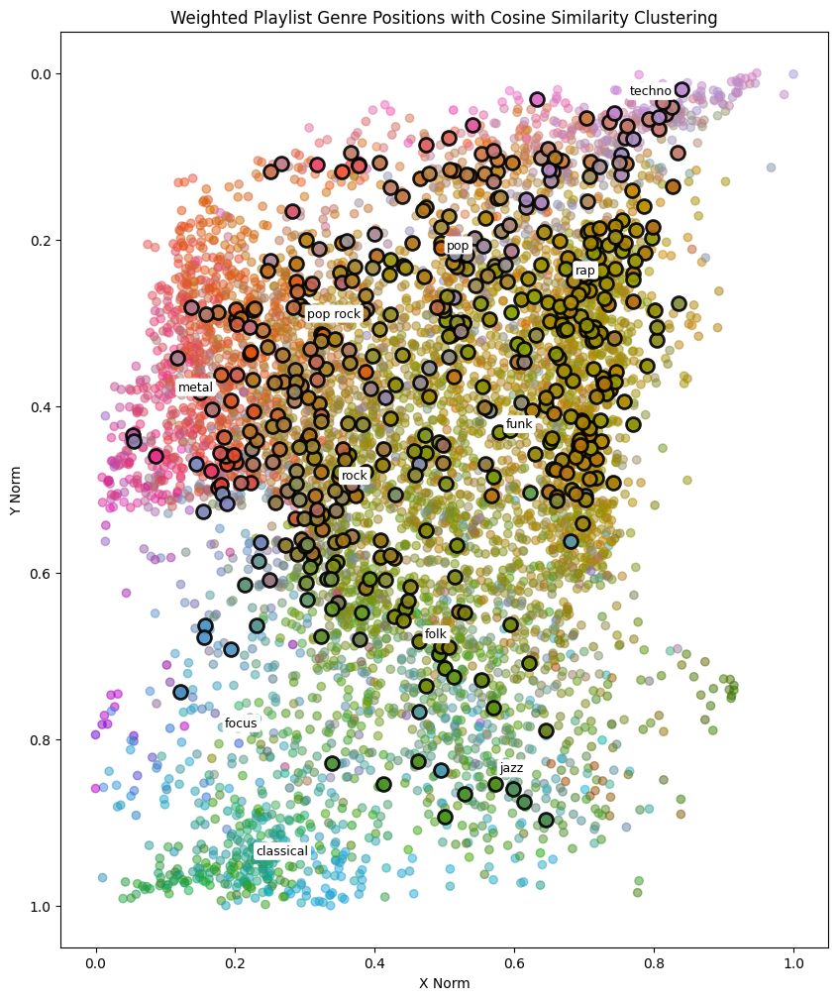

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
from matplotlib.colors import LinearSegmentedColormap


def euclidean_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)

cluster_centroids = selected_enao[selected_enao['genre'].isin(genres_to_label)].groupby('cluster')[['x_norm', 'y_norm']].mean()# Assign each emphasized genre to the cluster with the minimum distance from its centroid
emphasis_genres = list(sorted_genre_weights.keys())
emphasis_genres_df = selected_enao[selected_enao['genre'].isin(emphasis_genres)]

centroids_list = cluster_centroids.values
for idx, row in emphasis_genres_df.iterrows():
    min_distance = float('inf')
    assigned_cluster = -1
    for cluster, centroid in enumerate(centroids_list):
        distance = euclidean_distance(row['x_norm'], row['y_norm'], centroid[0], centroid[1])
        if distance < min_distance:
            min_distance = distance
            assigned_cluster = cluster
    emphasis_genres_df.loc[idx, 'cluster'] = assigned_cluster

def create_scatter_plot(data, plot_title, emphasis_genres):
    plt.figure(figsize=(10, 12))
    plt.scatter(data["x_norm"], data["y_norm"], c=data["color"], alpha=0.5)
    
    for idx, row in emphasis_genres_df.iterrows():
        plt.scatter(row['x_norm'], row['y_norm'], color=row['color'], marker="o", edgecolors="black", s=100, linewidths=2, alpha=0.9)
    
    cluster_names = cluster_average_features['cluster_name'].tolist()
    for idx, row in cluster_centroids.iterrows():
        plt.text(row["x_norm"] - 0.02, row["y_norm"] - 0.02, cluster_names[idx], fontsize=9, color='black', bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.2'))
    
    plt.xlabel("X Norm")
    plt.ylabel("Y Norm")
    plt.title(plot_title)
    plt.gca().invert_yaxis()
    
create_scatter_plot(selected_enao, "Weighted Playlist Genre Positions with Cosine Similarity Clustering", emphasis_genres)
plt.show()

## Weighted Genre Clusters Based on Emphasized Genres

This code block calculates the total weights for each genre cluster, considering the emphasized genres and their assigned cluster centroids marked by feature similarity.

Initially, the code creates a list of cluster names and initializes a 'closest_centroid' column in the emphasis_genres_df DataFrame. Then, it calculates the distances to the cluster centroids for each emphasized genre and assigns each genre to the closest centroid.

The total weight for each cluster is determined by calculating the sum of the weights of the associated emphasized genres using the sorted_genre_weights dictionary. These weights are stored in the cluster_weights dictionary.

Lastly, the code displays the total weights per cluster, providing insight into the relative importance of each genre cluster concerning the emphasized genres.

In [5]:
cluster_names = cluster_average_features['cluster_name'].tolist()

emphasis_genres_df['closest_centroid'] = -1

for genre_index, row in emphasis_genres_df.iterrows():
    min_distance = float('inf')
    assigned_cluster = -1
    for cluster_index, centroid in cluster_centroids.iterrows():
        distance = euclidean_distance(row['x_norm'], row['y_norm'], centroid['x_norm'], centroid['y_norm'])
        if distance < min_distance:
            min_distance = distance
            assigned_cluster = cluster_index
    emphasis_genres_df.at[genre_index, 'closest_centroid'] = assigned_cluster

cluster_weights = {}

for cluster_index, cluster_name in enumerate(cluster_names):
    associated_genres = emphasis_genres_df[emphasis_genres_df['closest_centroid'] == cluster_index]['genre'].values
    total_weight = sum(sorted_genre_weights[genre] for genre in associated_genres)
    cluster_weights[cluster_name] = total_weight

print("Total weights per cluster:")

for cluster_name, total_weight in cluster_weights.items():
    print(f"{cluster_name:<15} : {total_weight:.4f}")

Total weights per cluster:
rock            : 0.0793
rap             : 0.1889
pop             : 0.0901
pop rock        : 0.0542
funk            : 0.1036
jazz            : 0.0053
focus           : 0.0048
metal           : 0.0300
folk            : 0.0233
techno          : 0.0199
classical       : 0.0000


/var/folders/y_/d0wbwn_s1tlbh09zvpsn9bp40000gn/T/ipykernel_23694/2209042183.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emphasis_genres_df['closest_centroid'] = -1


### Displaying Sorted Genres per Cluster

Lets display the emphasized genres sorted by their weights assigned to a particular cluster. 

1. **Sort Genres per Cluster**:

    - Initialize a dictionary `sorted_genres_per_cluster` to store the sorted genres assigned to each cluster.
    - Iterate through each cluster, extract associated genres, and obtain their weights using the `sorted_genre_weights` dictionary.
    - Sort the genres by their weights in descending order and store the sorted pair of genres and weights in the `sorted_genres_per_cluster` dictionary.

2. **Display Results**: Print the sorted genres and their weights in each cluster, alongside the cluster name, in a clean and organized manner.

In [6]:
sorted_genres_per_cluster = {}

for cluster_index, cluster_name in enumerate(cluster_names):
    associated_genres = emphasis_genres_df[emphasis_genres_df['closest_centroid'] == cluster_index]['genre'].values
    associated_weights = [sorted_genre_weights[genre] for genre in associated_genres]
    sorted_genres_with_weights = sorted(zip(associated_genres, associated_weights), key=lambda x: x[1], reverse=True)
    sorted_genres_per_cluster[cluster_name] = sorted_genres_with_weights

print("Genres per cluster (sorted by score):")
print("----------------------------------------")

for cluster_name, sorted_genres in sorted_genres_per_cluster.items():
    print(f"Cluster {cluster_name}:")
    for genre, weight in sorted_genres:
        print(f"  {genre:<25}: {weight:.4f}")
    print("----------------------------------------")

Genres per cluster (sorted by score):
----------------------------------------
Cluster rock:
  rock                     : 0.0047
  alternative rock         : 0.0039
  indie rock               : 0.0037
  indie pop                : 0.0027
  art rock                 : 0.0026
  art pop                  : 0.0025
  classic rock             : 0.0024
  mellow gold              : 0.0021
  album rock               : 0.0020
  psychedelic rock         : 0.0019
  experimental rock        : 0.0018
  lo-fi                    : 0.0017
  chamber pop              : 0.0016
  melancholia              : 0.0014
  soft rock                : 0.0014
  zolo                     : 0.0013
  experimental             : 0.0013
  lo-fi indie              : 0.0012
  small room               : 0.0012
  protopunk                : 0.0012
  no wave                  : 0.0011
  slowcore                 : 0.0010
  experimental pop         : 0.0010
  british invasion         : 0.0010
  stomp and holler         : 0.0009
  glam 

In [7]:
import json

data_to_save = {
    "cluster_weights": cluster_weights,
    "sorted_genres_per_cluster": sorted_genres_per_cluster
}

with open('weighted_rec_genre.json', 'w') as json_file:
    json.dump(data_to_save, json_file)

## Generating a Weighted List of Parent and Subgenres from Playlist Data Considering Similarity

Now we compute a weighted list of subgenres by considering parent genres, associated subgenres, and their similarities to the user's playlist data.

Initially, the code reads the JSON data containing information on parent genres, subgenres for each genre, and cluster weights. From the loaded data, it extracts and normalizes parent genre weights and subgenre weights associated with each parent genre.

The number of subgenres to include in recommendations is set, and for each parent genre, a fixed number of top subgenres are chosen based on their weights. A dictionary is formed with parent genres as keys and selected subgenres as values.

Parent and selected subgenres' weights are combined, normalized, and recalculated to create a balanced list that maintains the original weights' distribution. The recalculated weights, along with their respective subgenres, are added to a list of tuples and sorted in descending order of their weights.

To accommodate user preferences for existing playlists, two additional weights for genres are calculated using normalized maximum weights. These weights are for the "existing playlist" and "similar playlist" genres.

The final output presents a weighted list of parent and subgenres, including 'existing playlist' and 'similar playlist,' providing users with a diverse range of genre recommendations based on their listening history and preferences. The output enables users to explore new music genres that align with their current listening habits and expand their musical experiences.

In [6]:
import json
import math
from pprint import pprint

with open("weighted_rec_genre.json", "r") as file:
    data = json.load(file)

parent_genre_weights = data['cluster_weights']

subgenre_weights = {genre: {subgenre[0]: subgenre[1] for subgenre in subgenres if subgenre[0] != genre} for genre, subgenres in data['sorted_genres_per_cluster'].items()}

normalized_parent_genre_weights = {k: v / sum(parent_genre_weights.values()) for k, v in parent_genre_weights.items()}

total_recommendations = 15
recommendations_per_genre = {k: min(total_recommendations, len(v)) for k, v in subgenre_weights.items()}

selected_subgenres = {}
for parent_genre, k in recommendations_per_genre.items():
    sorted_subgenres = sorted(subgenre_weights[parent_genre].items(), key=lambda x: x[1], reverse=True)
    selected_subgenres[parent_genre] = [subgenre for subgenre, weight in sorted_subgenres][:k]

all_selected_subgenres = {}
for parent_genre, subgenres in selected_subgenres.items():
    for subgenre in subgenres:
        all_selected_subgenres[f"{subgenre}"] = subgenre_weights[parent_genre][subgenre] * normalized_parent_genre_weights[parent_genre]

total_weight = sum(all_selected_subgenres.values())
recalculated_subgenre_weights = {k: v / total_weight for k, v in all_selected_subgenres.items()}

recalculated_subgenre_weights_list = [(k, v) for k, v in recalculated_subgenre_weights.items()]

sorted_subgenre_weights_list = sorted(recalculated_subgenre_weights_list, key=lambda x: x[1], reverse=True)

max_weight = sorted_subgenre_weights_list[0][1]

existing_playlist_weight = .1 * max_weight
similar_playlist_weight = .02 * max_weight

sorted_subgenre_weights_list.extend([("existing playlist", existing_playlist_weight), ("similar playlist", similar_playlist_weight)])

sorted_subgenre_weights_list = sorted(sorted_subgenre_weights_list, key=lambda x: x[1], reverse=True)

pprint(sorted_subgenre_weights_list)

[('hip hop', 0.1083271936286511),
 ('underground hip hop', 0.08157994251265374),
 ('vapor trap', 0.08028556760522831),
 ('trap', 0.05907758620074612),
 ('dark trap', 0.05056106725222655),
 ('plugg', 0.044434850104867196),
 ('melodic rap', 0.02931025474271084),
 ('alternative hip hop', 0.025647255165149537),
 ('southern hip hop', 0.02524259733612499),
 ('atl hip hop', 0.025092153169753197),
 ('east coast hip hop', 0.021399621972819343),
 ('pop rap', 0.021156322252505355),
 ('new orleans rap', 0.02070596008896615),
 ('pluggnb', 0.018531844339968163),
 ('miami hip hop', 0.017487379771328),
 ('gangster rap', 0.017355778298342544),
 ('chicago rap', 0.016954280922070433),
 ('emo rap', 0.013231666894020198),
 ('psychedelic hip hop', 0.012926974348695705),
 ('experimental hip hop', 0.011357665224561837),
 ('aesthetic rap', 0.011283627836769006),
 ('existing playlist', 0.01083271936286511),
 ('conscious hip hop', 0.009817164998695825),
 ('alternative rock', 0.00908886547563794),
 ('glitchcore',

In [33]:
import pickle

# Save the sorted_subgenre_weights_list using pickle
with open("sorted_subgenre_weights_list.pkl", "wb") as file:
    pickle.dump(sorted_subgenre_weights_list, file)

## Generating Customized Artist Genres with Playlist Associations

The given code block computes a customized list of artist genres, emphasizing their presence in the user's existing playlist and their association with similar artists.

1. **Extract unique artist IDs**: The code retrieves unique track IDs from `playlist_df` and processes them in batches to obtain the corresponding artist IDs.

2. **Fetch artist details**: Using artist ID batches, the code employs the Spotify Web API to gather the details of each artist, such as their name and genres. It adds an 'existing playlist' label to the genres of artists found in the user's playlist.

3. **Fetch similar artists**: The code fetches similar artists using the Spotify API and adds a 'similar playlist' label to their genres.

4. **Filter and combine genres**: The genres are filtered based on the `sorted_subgenre_weights_list`, and both the original and additional genres ('existing playlist' and 'similar playlist') are combined. This step creates a comprehensive list of genres for each artist reflecting their relationship with the user's playlist and similar artists.

The output is a dictionary, `final_artist_genres`, containing artist names as keys and their customized genres as values. This list highlights the association between the artist genres and the user's preferences, promoting a personalized music exploration experience.

In [4]:
import requests
import spotipy
from spotipy.oauth2 import SpotifyOAuth
import json
import configparser
from urllib.parse import quote
import time
import warnings
warnings.filterwarnings('ignore')

config = configparser.ConfigParser()
config.read('config.ini')

USERNAME = config.get('SPOTIFY', 'username')
PASSWORD = config.get('SPOTIFY', 'password')
CLIENT_ID = config.get('SPOTIFY', 'client_id')
CLIENT_SECRET = config.get('SPOTIFY', 'client_secret')
REDIRECT_URI = config.get("SPOTIFY", 'redirect_uri')
SCOPE = config.get('SPOTIFY', 'scope')

sp = spotipy.Spotify(auth_manager=SpotifyOAuth(client_id=CLIENT_ID,
                                               client_secret=CLIENT_SECRET,
                                               redirect_uri=REDIRECT_URI,
                                               scope=SCOPE,
                                               username=USERNAME))

In [13]:
import time
import pandas as pd
import pickle
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor

def parse_artist_ids(artist_ids_str):
    cleaned_str = artist_ids_str.strip("[]").replace("'", "").replace(" ", "")
    return cleaned_str.split(',')

def fetch_batch_genres(batch):
    artists = sp.artists(batch)
    time.sleep(0.1)
    result = {}
    for artist in artists['artists']:
        result[artist['id']] = (artist['name'], artist['genres'] + ['existing playlist'])
    return result

def fetch_similar_artists_genres(artist_id, artist_genres, original_artist_ids):
    retries = 3
    result = {}

    if not artist_id in artist_genres:
        return {}

    for attempt in range(retries):
        try:
            similar_artists = sp.artist_related_artists(artist_id)
            time.sleep(0.1)

            existing_artist_name, existing_artist_genres = artist_genres[artist_id]
            existing_artist_genres = [genre for genre in existing_artist_genres if genre != 'existing playlist']

            for artist in similar_artists['artists']:
                current_genres = artist['genres'] + existing_artist_genres
                if artist['id'] in artist_genres:
                    artist_name, current_artist_genres = artist_genres[artist['id']]
                    current_genres += current_artist_genres

                result[artist['id']] = (artist['name'], list(set(current_genres)) + ['similar playlist'])

            break

        except (KeyError, Exception) as e:
            if attempt == retries - 1:
                print(f"Error fetching similar artists for artist_id {artist_id}: {e} - Skipping after {retries} retries")
            else:
                print(f"Error fetching similar artists for artist_id {artist_id}: {e} - Retrying...")
                time.sleep(1)

    return result

def save_cache(obj, filename):
    with open(filename, 'wb') as file:
        pickle.dump(obj, file)

def load_cache(filename):
    try:
        with open(filename, 'rb') as file:
            return pickle.load(file)
    except FileNotFoundError:
        return None

playlist_df = pd.read_csv("features_df.csv")

parsed_artist_ids_series = playlist_df['artist_ids'].apply(parse_artist_ids)
artist_ids_df = pd.DataFrame(parsed_artist_ids_series.tolist())
exploded_artist_ids_df = artist_ids_df.stack().reset_index(level=1, drop=True)
artist_ids = exploded_artist_ids_df.unique()

batch_size = 50
artist_ids_batches = [artist_ids[i:i + batch_size] for i in range(0, len(artist_ids), batch_size)]
artist_genres = {}

# Try to load cache
loaded_artist_genres = load_cache('artist_genres_cache.pkl')
if loaded_artist_genres:
    artist_genres = loaded_artist_genres
else:
    executor = ThreadPoolExecutor()
    batch_genres_results = list(tqdm(executor.map(fetch_batch_genres, artist_ids_batches), total=len(artist_ids_batches)))
    executor.shutdown(wait=True)

    for result in batch_genres_results:
        artist_genres.update(result)

    save_cache(artist_genres, 'artist_genres_cache.pkl')  # Save the cache after fetching original artists

    original_artist_ids = set(exploded_artist_ids_df.to_list())  # Get the original_artist_ids

    executor = ThreadPoolExecutor()
    similar_artists_results = list(tqdm(executor.map(fetch_similar_artists_genres, artist_ids, [artist_genres for _ in artist_ids], [original_artist_ids for _ in artist_ids]), total=len(artist_ids)))
    executor.shutdown(wait=True)

    for result in similar_artists_results:
        artist_genres.update(result)

    save_cache(artist_genres, 'artist_genres_cache.pkl')  # Save the cache after fetching similar artists

final_artist_genres = {}
for artist_id, (artist_name, genres) in artist_genres.items():
    unique_genres = list(set(genres))
    final_artist_genres[artist_name] = [genre for genre in unique_genres if genre in dict(sorted_subgenre_weights_list) or genre in ['existing playlist', 'similar playlist']]

100%|█████████████████████████████████████████| 827/827 [00:15<00:00, 54.59it/s]


## Expanding Personalized Artist Genres with Additional Related Artists

1. **Read the data**: The code reads the "all_genres1.csv" file, which contains information about genres and their related artists as scraped from Every Noise At Once, into a DataFrame called `all_genres_df`. It also creates a list of genres to match, based on the `sorted_subgenre_weights_list`.

2. **Fetch related artists based on genres**: The code defines a function called `fetch_related_artists` to fetch related artists based on genres from the DataFrame. The function iterates over each genre in the `genres_to_match` and retrieves rows from the `all_genres_df` containing matching genres. It stores the artists and their genres in a dictionary called `artist_pool`.

3. **Retrieve artists and their associated genres**: The `fetch_related_artists` function is called with `all_genres_df` and `genres_to_match` as arguments, resulting in a dictionary `related_artists` containing the artists and their associated genres.

4. **Create the final merged_dict for recommended genres**: The code creates a new dictionary called `rec_genres` to store the final merged information by copying the contents of the `final_artist_genres` dictionary.

5. **Merge the `final_artist_genres` with the `rec_genres` dictionaries**: The code iterates through the `final_artist_genres` dictionary and checks if an artist is already in `rec_genres`. If so, the code appends only unique genres to the existing artist entry; otherwise, it adds a new entry with the artist name and associated genres.




In [15]:
import pandas as pd

all_genres_df = pd.read_csv("all_genres1.csv")
genres_to_match = [genre for genre, weight in sorted_subgenre_weights_list]

def fetch_related_artists(df, genres_to_match):
    artist_pool = {}
    
    for genre in genres_to_match:
        matching_rows = df[df['GENRE'] == genre]
        
        for _, row in matching_rows.iterrows():
            rel_artists = row['REL_ARTISTS'].split(',')
            
            for artist in rel_artists:
                artist = artist.strip()
                if artist not in artist_pool:
                    artist_pool[artist] = [genre]
                else:
                    artist_pool[artist].append(genre)
    
    return artist_pool

related_artists = fetch_related_artists(all_genres_df, genres_to_match)

rec_genres = final_artist_genres.copy()

for artist, genres in related_artists.items():
    if artist in rec_genres:
        custom_genres = [g for g in rec_genres[artist] if g in ['existing playlist', 'similar playlist']]

        unique_genres = list(set(rec_genres[artist] + genres) - set(custom_genres))

        rec_genres[artist] = unique_genres + custom_genres
    else:
        rec_genres[artist] = genres

## Fetching Top Tracks of Related Artists

Now using the created `rec_genres` dictionary, we need to find each artist's Spotify ID number, and then we utilize this ID in order to gain each artists top tracks. Rate limits for this aspect of the overall workflow became a very pressing issue, and thus the code utilizes about every possible method to avoit hitting these arbitrary rolling 30 second capped values. We accomplish this through the use of the following:

1. **Decorators**:
    - `retry`: This decorator is used to retry a function in case of failure (e.g., request exceptions), and to handle rate limiting by pausing the program execution before retrying.

2. **Rate Limiter**:
    - `RateLimiter`: This is an instance of `RateLimiter` that limits the number of calls within a specific time period to manage rate limits.

3. **Functions**:
    - `get_artist_top_tracks(artist_id, artist, genres)`: This function takes three arguments - artist ID, artist's name, and a list of genres. It searches the Spotify API for the given artist ID and retrieves the top tracks of the artist. It collects track information and returns a list of dictionaries containing track data.
    
    - `get_artist_ids_batch(artists)`: This function takes a list of artist names as input and uses a ThreadPoolExecutor to retrieve artist IDs concurrently. It stores the results in a dictionary and returns it.
    
    - `process_artist(artist, genres, all_artist_ids, semaphore)`: This function takes an artist's name, list of genres, all_artist_ids dictionary, and a semaphore as input. The function acquires the semaphore and checks if the artist is in the `all_artist_ids` dictionary. If it is found, the function calls `get_artist_top_tracks` and releases the semaphore before returning the tracks data.

    - `load_cache(cache_name)`: This function attempts to load cached data from a cache file with the given cache name. If the file is not found, it returns None.

    - `processed_artists(cached_data)`: This function takes a list of cached track data and extracts the processed artists' names to a set.

    - `get_top_tracks(artist_pool)`: This function takes an `artist_pool` dictionary with artist names as keys and associated genres as values. It uses a ThreadPoolExecutor to execute the `process_artist` function concurrently for each artist. As tasks complete, the results are collected in a list named `top_tracks_data`. The function then converts the collected data to a pandas DataFrame and returns it.

4. **Cache Management**: `cache_file` is used to cache the artist_ids to prevent unnecessary API requests. `cache_top_tracks_data.pkl` is used to cache the result of top tracks in case the program needs to be stopped/restarted.

5. **Batch Processing**: `batch_size` is set to 50, and artist names are divided into batches for processing. `get_artist_ids_batch()` is called to fetch artist IDs for each batch, updating the `all_artist_ids` dictionary and caching the result.

6. **Execute Function**: The `get_top_tracks()` function is called with the `rec_genres` dictionary as input. The function returns a DataFrame named `top_tracks_df`, containing the top tracks and related information for each artist.

In [24]:
import os
import pickle
import time
from tqdm import tqdm
import concurrent.futures
import functools
import pandas as pd
import threading
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

def get_artist_id(artist):
    search_result = sp.search(artist, type="artist", limit=1)

    if search_result['artists']['items']:
        return search_result['artists']['items'][0]['id']
    else:
        return None

def retry(retries=3, delay=1):
    def decorator_retry(func):
        @functools.wraps(func)
        def wrapper_retry(*args, **kwargs):
            for _ in range(retries + 1):
                try:
                    return func(*args, **kwargs)
                except spotipy.SpotifyException as e:
                    if e.http_status == 429:
                        if _ == retries:
                            print(f"Error processing function {func.__name__}: {e}")
                            return None
                        retry_after = int(e.headers.get('Retry-After', delay))
                        print(f"Rate limit exceeded. Retrying in {retry_after} seconds.")
                        time.sleep(retry_after)
                    else:
                        print(f"Error processing function {func.__name__}: {e}")
                        time.sleep(delay)
        return wrapper_retry
    return decorator_retry

def get_artist_top_tracks(artist_id, artist, genres):
    top_tracks_data = []
    max_retries = 2

    for attempt in range(max_retries + 1):
        try:
            top_tracks = sp.artist_top_tracks(artist_id, country='US')

            for track in top_tracks['tracks']:
                track_data = {
                    'artist': artist,
                    'genres': ', '.join(genres),
                    'track_name': track['name'],
                    'track_id': track['id'],
                    'popularity': track['popularity'],
                    'duration_ms': track['duration_ms']
                }
                top_tracks_data.append(track_data)
            break
        except Exception as e:
            if attempt == max_retries:
                print(f"Error fetching track ID for artist {artist} with ID {artist_id}: {e}")
                return None
            else:
                time.sleep(1)
    return top_tracks_data

def get_artist_ids_batch(artists):
    artist_ids = {}
    with concurrent.futures.ThreadPoolExecutor() as executor:
        futures = {executor.submit(get_artist_id, artist): artist for artist in artists}
        for future in concurrent.futures.as_completed(futures):
            artist = futures[future]
            try:
                artist_id = future.result()
                if artist_id:
                    artist_ids[artist] = artist_id
            except Exception as e:
                print(f"Error fetching artist ID for artist {artist}: {e}")

    return artist_ids

@retry(retries=1)
def process_artist(artist, genres, all_artist_ids, semaphore):
    semaphore.acquire()
    try:
        if artist in all_artist_ids:
            artist_id = all_artist_ids[artist]
            tracks_data = get_artist_top_tracks(artist_id, artist, genres)
            return tracks_data
    finally:
        semaphore.release()

def load_cache(cache_name):
    try:
        with open(cache_name, "rb") as cache_file:
            return pickle.load(cache_file)
    except FileNotFoundError:
        return None

def processed_artists(cached_data):
    return {track['artist'] for track in cached_data}

def get_top_tracks(artist_pool):
    top_tracks_data = []

    semaphore = threading.BoundedSemaphore(60)

    cache_name = "cache_top_tracks_data.pkl"
    cached_data = load_cache(cache_name)

    if cached_data:
        print("Loading data from cache")
        top_tracks_data.extend(cached_data)
        processed_artists_set = processed_artists(cached_data)
    else:
        processed_artists_set = set()

    with concurrent.futures.ThreadPoolExecutor(max_workers=20) as executor:
        futures = [executor.submit(process_artist, artist, genres, all_artist_ids, semaphore) for artist, genres in artist_pool.items() if artist not in processed_artists_set]

        cache_counter = len(processed_artists_set)

        for future in tqdm(concurrent.futures.as_completed(futures), total=len(futures), desc="Fetching tracks"):
            try:
                track_data = future.result()
                if track_data:
                    top_tracks_data.extend(track_data)

                    cache_counter += 1
                    if cache_counter % 100 == 0:
                        with open(cache_name, "wb") as cache_file:
                            pickle.dump(top_tracks_data, cache_file)
            except Exception as e:
                print(f"Error processing future: {e}")

    top_tracks_df = pd.DataFrame(top_tracks_data)
    return top_tracks_df

In [28]:
cache_file = "artist_ids_cache.pkl"

if os.path.exists(cache_file) and os.path.getsize(cache_file) > 0:
    with open(cache_file, "rb") as f:
        all_artist_ids = pickle.load(f)
    print("Loaded artist IDs from cache file.")
else:
    all_artist_ids = {}

batch_size = 50
artist_batches = [list(rec_genres.keys())[i:i + batch_size] for i in range(0, len(rec_genres.keys()), batch_size)]

for batch in tqdm(artist_batches, desc="Fetching artist IDs"):
    artists_to_search = [artist for artist in batch if artist not in all_artist_ids]
    batch_artist_ids = get_artist_ids_batch(artists_to_search)

    all_artist_ids.update(batch_artist_ids)

    # Save the cache after processing each batch
    with open(cache_file, "wb") as f:
        pickle.dump(all_artist_ids, f)

Loaded artist IDs from cache file.


Fetching artist IDs:  76%|███████████████▏    | 305/401 [04:35<03:44,  2.34s/it]

Error fetching artist ID for artist 'Buddy Guy': HTTPSConnectionPool(host='api.spotify.com', port=443): Read timed out. (read timeout=5)


Fetching artist IDs:  92%|██████████████████▍ | 370/401 [05:55<01:13,  2.38s/it]

Error fetching artist ID for artist 'Oxossi': HTTPSConnectionPool(host='api.spotify.com', port=443): Read timed out. (read timeout=5)


Fetching artist IDs: 100%|████████████████████| 401/401 [06:32<00:00,  1.02it/s]


In [29]:
top_tracks_df = get_top_tracks(rec_genres)

Loading data from cache


Fetching tracks: 100%|█████████████████████| 7869/7869 [01:04<00:00, 122.87it/s]


## Fetching Audio Features for Top Tracks and Merging with Existing Data

Now we fetch audio features for the top tracks of related artists and merge them with the existing top tracks data. The code leverages the `spotipy` library for fetching audio features through the Spotify API and `concurrent.futures` for parallel fetching. 


1. **Functions**:
    - `get_audio_features(track_ids)`: This function accepts a list of track IDs, fetches their audio features from the Spotify API, and returns them.
    
    - `batch(iterable, n=1)`: This function divides the given iterable into batches of size `n`.
    
    - `load_cache(cache_name)` and `save_cache(cache_name, data)`: These functions help to load and save Pickle cache, reducing the need for unnecessary API requests.
    
    - `get_audio_features_df(df)`: This function takes a DataFrame with a 'track_id' column and fetches audio features for each track ID concurrently. It first checks if the cache (`audio_features_cache.pkl`) has any data. If it does, then it skips processing tracks that exist within the cache. Otherwise, it fetches the audio features and merges them with the input DataFrame. The resulting DataFrame contains both track details and audio features. The fetched audio features are saved to cache for further use.

2. **Execute Function**: The `get_audio_features_df()` function is called with the `top_tracks_df` DataFrame as input. The function returns a new DataFrame named `top_feat_df` containing the top tracks and related information, including the audio features for each track.


In [30]:
import re
import concurrent.futures
from tqdm import tqdm
import spotipy
from ratelimiter import RateLimiter
import time
from functools import wraps

rate_limiter = RateLimiter(max_calls=50, period=1)

def retry(retries=3, delay=1):
    def decorator_retry(func):
        @wraps(func)
        def wrapper_retry(*args, **kwargs):
            for _ in range(retries + 1):
                try:
                    return func(*args, **kwargs)
                except spotipy.SpotifyException as e:
                    if e.http_status == 429:
                        if _ == retries:
                            print(f"Error processing function {func.__name__}: {e}")
                            return None
                        retry_after = int(e.headers.get('Retry-After', delay))
                        print(f"Rate limit exceeded. Retrying in {retry_after} seconds.")
                        time.sleep(retry_after)
                    else:
                        print(f"Error processing function {func.__name__}: {e}")
                        time.sleep(delay)
        return wrapper_retry
    return decorator_retry

@retry(retries=3)
def get_audio_features(track_ids):
    audio_features = sp.audio_features(track_ids)
    return audio_features

def batch(iterable, n=1):
    length = len(iterable)
    for ndx in range(0, length, n):
        yield iterable[ndx:min(ndx + n, length)]

# Load Pickle Cache
def load_cache(cache_name):
    try:
        with open(cache_name, "rb") as cache_file:
            return pickle.load(cache_file)
    except FileNotFoundError:
        return None

# Save Pickle Cache
def save_cache(cache_name, data):
    with open(cache_name, "wb") as cache_file:
        pickle.dump(data, cache_file)

def get_audio_features_df(df):
    cache_name = "audio_features_cache.pkl"
    cached_data = load_cache(cache_name)

    if cached_data:
        processed_track_ids = {row["track_id"] for row in cached_data}
        df = df[~df["track_id"].isin(processed_track_ids)]

    if df.empty:
        return pd.DataFrame(cached_data)

    track_ids = df['track_id'].tolist()
    all_features = []

    with concurrent.futures.ThreadPoolExecutor() as executor:
        track_id_batches = list(batch(track_ids, n=50))

        with rate_limiter:
            futures = [executor.submit(get_audio_features, batch) for batch in track_id_batches]

            for future in tqdm(concurrent.futures.as_completed(futures), total=len(futures), desc="Fetching audio features"):
                result = future.result()
                if result is not None:
                    result = [r for r in result if r is not None]
                    all_features.extend(result)

    audio_features_df = pd.DataFrame(all_features)
    merged_df = pd.merge(df, audio_features_df, left_on='track_id', right_on='id', how='inner')

    relevant_columns = ['artist', 'genres', 'track_name', 'track_id', 'popularity', 'duration_ms_x', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
    merged_df = merged_df[relevant_columns]
    merged_df.rename(columns={'duration_ms_x': 'duration_ms'}, inplace=True)

    if cached_data:
        merged_df = pd.concat([pd.DataFrame(cached_data), merged_df], ignore_index=True)

    save_cache(cache_name, merged_df.to_dict("records"))

    return merged_df

top_feat_df = get_audio_features_df(top_tracks_df)
top_feat_df = top_feat_df.drop_duplicates(subset='track_id')
top_feat_df['artist'] = top_feat_df['artist'].str.replace(r"[\'\[\]]", "", regex=True)

Fetching audio features: 100%|██████████████| 3872/3872 [01:05<00:00, 59.17it/s]


In [31]:
import datetime
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
file_name = f"tracks_for_rec_{timestamp}.csv"
top_feat_df.to_csv(file_name, index=False)

## Interactive User Input for Desired Feature Values

This snippet helps interactively collect user inputs for desired feature values and importance levels using the `get_user_inputs()` function. The function prompts users to enter their preferences for various features and their respective importance levels.

A function called `get_feature_info()` is created to define and return a dictionary containing feature names and relevant information, such as prompt messages, ranges, units, importance prompts, and conversion functions.

Several functions have been defined to handle user inputs and normalization:

- `get_numeric_input()`: prompts the user for valid numeric input within a specified range using a given unit.
- `get_desired_value()`: retrieves a desired value and its importance from the user using the feature_name and feature_info dictionary.
- `normalize()`: normalizes a given value from an old range to a new range.

The `get_user_inputs()` function iterates through the `feature_info` dictionary, prints prompts for each feature, and calls the `get_desired_value()` function to collect user inputs. It stores the collected input in two dictionaries, `desired_values` and `importance_values`, for further processing.

By calling the `get_user_inputs()` function, this code snippet provides an interactive method for gathering user preferences. Once collected, these preferences can be used to customize the output of a music recommendation engine or perform custom data analysis.

In [32]:
def get_numeric_input(prompt, min_value, max_value, unit):
    while True:
        try:
            value = float(input(prompt))
            if min_value <= value <= max_value:
                return value
            else:
                print(f"Please enter a value between {min_value}{unit} and {max_value}{unit}.")
        except ValueError:
            print("Invalid input, please enter a numeric value.")

def get_desired_value(feature_name, feature_info):
    prompt, min_value, max_value, unit, importance_prompt, conversion_func = feature_info[feature_name]

    print(prompt)
    value = get_numeric_input("Choose a value: ", min_value, max_value, unit)
    importance = get_numeric_input(importance_prompt, 0, 10, "")

    return conversion_func(value), normalize(importance, 0, 10, 0, 1)

def normalize(value, old_min, old_max, new_min, new_max):
    return (((value - old_min) * (new_max - new_min)) / (old_max - old_min)) + new_min

def duration_converter(value):
    return value * 1000

def identity(x):
    return x

def get_feature_info():
    return {
        "danceability": (
            "Danceability level: 1 (not danceable) to 10 (super danceable) (e.g. 1 - Classical, 10 - Electronic Dance)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 1),
        ),
        "energy": (
            "Energy level: 1 (low energy) to 10 (high energy) (e.g. 1 - Lullaby, 10 - Heavy Metal)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 1),
        ),
        "loudness": (
            "Loudness level: 1 (quiet) to 10 (loud) (e.g. 1 - Quiet instrumental, 10 - Loud rock concert)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, -60, 0),
        ),
        "speechiness": (
            "Speechiness level: 1 (purely music) to 10 (talkative) (e.g. 1 - Instrumental, 10 - Podcast)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 1),
        ),
        "acousticness": (
            "Acousticness level: 1 (electronic) to 10 (acoustic) (e.g. 1 - Techno, 10 - Acoustic guitar)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 1),
        ),
        "instrumentalness": (
            "Instrumentalness level: 1 (vocal) to 10 (instrumental) (e.g. 1 - Pop song, 10 - Orchestra)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 1),
        ),
        "liveness": (
            "Liveness level: 1 (studio recording) to 10 (live performance) (e.g. 1 - Studio album, 10 - Live performance)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 1),
        ),
        "valence": (
            "Valence level: 1 (sad) to 10 (happy) (e.g. 1 - Sad ballad, 10 - Upbeat pop)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 1),
        ),
        "tempo": (
            "Tempo range: 1 (slow) to 10 (fast) (e.g. 1 - Slow ballad, 10 - Fast electronic dance)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 60, 200),
        ),
        "popularity": (
            "Popularity range: 1 (low) to 10 (high) (e.g. 1 - Niche artist, 10 - Chart-topper)",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: normalize(x, 1, 10, 0, 100),
        ),
        "duration_ms": (
            "Duration range: 1 (short) to 10 (long) (e.g. 1 - Short jingle, 10 - Long symphony) in seconds",
            1, 10, "", "Enter its importance (0 to 10, with 0 being not included): ", lambda x: duration_converter(normalize(x, 1, 10, 60, 600)),
        ),
    }

def get_user_inputs():
    feature_info = get_feature_info()
    desired_values = {}
    importance_values = {}

    for feature_name in feature_info:
        print("=" * 80)
        value, importance = get_desired_value(feature_name, feature_info)

        desired_values[feature_name] = value
        importance_values[feature_name] = importance

    return desired_values, importance_values

desired_values, importance_values = get_user_inputs()
print(desired_values)
print(importance_values)

Danceability level: 1 (not danceable) to 10 (super danceable) (e.g. 1 - Classical, 10 - Electronic Dance)
Choose a value: 7
Enter its importance (0 to 10, with 0 being not included): 6
Energy level: 1 (low energy) to 10 (high energy) (e.g. 1 - Lullaby, 10 - Heavy Metal)
Choose a value: 6
Enter its importance (0 to 10, with 0 being not included): 6
Loudness level: 1 (quiet) to 10 (loud) (e.g. 1 - Quiet instrumental, 10 - Loud rock concert)
Choose a value: 5
Enter its importance (0 to 10, with 0 being not included): 4
Speechiness level: 1 (purely music) to 10 (talkative) (e.g. 1 - Instrumental, 10 - Podcast)
Choose a value: 3
Enter its importance (0 to 10, with 0 being not included): 2
Acousticness level: 1 (electronic) to 10 (acoustic) (e.g. 1 - Techno, 10 - Acoustic guitar)
Choose a value: 4
Enter its importance (0 to 10, with 0 being not included): 6
Instrumentalness level: 1 (vocal) to 10 (instrumental) (e.g. 1 - Pop song, 10 - Orchestra)
Choose a value: 5
Enter its importance (0 to 

**Computing Similarity Scores for Tracks and Generating Recommendations**

This code snippet demonstrates how to compute similarity scores and generate recommendations for tracks based on user inputs by comparing them to audio features and genre weight. 

1. **Import Libraries**: Import necessary libraries like `numpy`.

2. **Functions**:

   - `continuous_similarity(x, y, sigma=0.1)`: Function to calculate the similarity between two continuous values using a Gaussian function.

   - `categorical_similarity(x, y)`: Function to calculate similarity between two categorical values. It returns 1 if the values are equal, else 0.

   - `compute_similarity_scores(row, desired_values, recalculated_subgenre_weights, importance_values)`: Function that computes the similarity score and average genre weight for each row in the DataFrame based on user inputs.

3. **Compute Similarity Scores**: Apply the `compute_similarity_scores` function to each row of the `top_feat_df` DataFrame. Add the resulting similarity scores and average genre weights as new columns.

4. **Calculate Combined Score**: Compute a combined score by weighing the similarity scores (40%) and the average genre weights (60%). Add this score as a new column called 'combined_score'.

5. **Generate Recommendations**: Sort the DataFrame based on the combined score and display the top 20 recommendations.

This code snippet demonstrates a way to generate music recommendations based on user inputs by considering the audio features and weighted genre information. It can be helpful in creating personalized playlists and offering users tailored recommendations.

In [36]:
import numpy as np
import pandas as pd
import pickle


with open("sorted_subgenre_weights_list.pkl", "rb") as file:
    sorted_subgenre_weights_list = pickle.load(file)
    
def continuous_similarity(x, y, sigma=0.1):
    return np.exp(-((x - y) ** 2) / (2 * sigma ** 2))

def categorical_similarity(x, y):
    return 1 if x == y else 0

def compute_similarity_scores(row, desired_values, sorted_subgenre_weights_dict, importance_values):
    similarity_sum = 0
    
    row_genres = ','.join(row['genres'].split(', '))
    
    genre_list = row_genres.split(',')
    genre_weight_sum = sum([sorted_subgenre_weights_dict[genre] for genre in genre_list if genre in sorted_subgenre_weights_dict])
    avg_genre_weight = genre_weight_sum / len(genre_list)
    
    for feature, value in desired_values.items():
        if feature in ['key', 'mode']:
            continue
        
        if feature in ['duration_ms']:
            similarity = continuous_similarity(value / 1000, row[feature])
        else:
            similarity = continuous_similarity(value, row[feature])
        
        importance = importance_values[feature]
        weighted_similarity = similarity * importance
        
        similarity_sum += weighted_similarity

    return (similarity_sum / sum(importance_values.values()), avg_genre_weight)

sorted_subgenre_weights_dict = dict(sorted_subgenre_weights_list)

top_feat_df['similarity_score'], top_feat_df['avg_genre_weight'] = zip(*top_feat_df.apply(compute_similarity_scores, axis=1, args=(desired_values, sorted_subgenre_weights_dict, importance_values)))
top_feat_df['combined_score'] = (0.4 * top_feat_df['similarity_score'] + 0.6 * top_feat_df['avg_genre_weight'])

recommendations = top_feat_df.sort_values(by='combined_score', ascending=False)

recommendations.head(50)

,artist,genres,track_name,track_id,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,similarity_score,avg_genre_weight,combined_score
59083,Wintertime,"miami hip hop, underground hip hop, dark trap,...",Me & Ben,4vrzpvXILOhfFaMbFaKFiZ,33,165120,0.582,0.532,9,-14.215,1,0.2070,0.360000,0.539000,0.0736,0.531,124.930,0.592254,0.046416,0.264751
233131,Deergod,similar playlist,Dom P Showers,4hDhcgOPbNTgl92lkp8cMw,53,137534,0.668,0.552,11,-12.660,0,0.2950,0.331000,0.471000,0.6400,0.490,93.977,0.656716,0.002167,0.263986
110340,Archy Marshall,similar playlist,Ammi Ammi,3RPacQGcu4qN4A1QYAIfUq,33,209839,0.609,0.573,11,-11.871,1,0.2470,0.359000,0.423000,0.5960,0.492,109.800,0.640244,0.002167,0.257398
188568,Joyner Lucas,"hip hop, pop rap",I Love,30z4LVkScpeNhwHFIB8Ewa,66,210197,0.671,0.565,11,-7.401,0,0.1600,0.274000,0.000065,0.3700,0.561,150.014,0.539086,0.064742,0.254479
59042,ilyTOMMY,"underground hip hop, aesthetic rap, similar pl...",Tunnel of Love,1K4OfBFaLleSUaUVjp1l2X,57,142364,0.683,0.636,7,-12.096,0,0.0978,0.302000,0.498000,0.0972,0.615,160.012,0.585260,0.031677,0.253110
136925,Pistola,"vapor trap, similar playlist",CA$H,3oow7zvWHMzjPPPyuy8KKw,11,221142,0.734,0.444,5,-13.371,0,0.1890,0.297000,0.436000,0.0820,0.501,139.976,0.570047,0.041226,0.252754
188695,KeithCharles Spacebar,underground hip hop,"Ask, If You Really Wanna Know (feat. Mother Ma...",5Gg3yWgOAP305g7lBem7YK,9,168737,0.707,0.540,10,-10.744,0,0.2260,0.154000,0.355000,0.0945,0.493,165.010,0.507146,0.081580,0.251806
52332,Cordae,"pop rap, trap, hip hop, underground hip hop, v...",Chronicles (feat. H.E.R. & Lil Durk),6oOJL3xj8zRz6URS0SwlXC,63,212076,0.678,0.527,4,-9.038,0,0.3010,0.300000,0.000000,0.1190,0.583,76.847,0.540869,0.058766,0.251607
233616,DJ Twin Glocks,vapor trap,"They Know Us (Feat. Sean Kingston, Lil Bibby &...",7a9XHEhlccgTzRcCJpMEOG,35,218498,0.725,0.498,5,-8.081,1,0.2050,0.274000,0.000003,0.1700,0.556,150.034,0.503519,0.080286,0.249579
199880,1of1,aesthetic rap,Chateau,6gClLxbq32u8bhukZ6hBaG,38,94675,0.690,0.555,7,-8.517,1,0.2020,0.356000,0.524000,0.3730,0.445,81.019,0.606208,0.011284,0.249253


1. **Import Libraries**: Import necessary libraries, such as `datetime` and `os` for handling date and file-related operations.

2. **Generate Unique Filename**:

    - Get today's date as a string using the `strftime()` function from `datetime`.
    - Initialize a counter variable to 1.
    - Define a base filename with the date string.
    - Check if a file with the current counter value exists in the current directory, and if so, increment the counter. Repeat this until a unique filename is available.

3. **Save Recommendations to CSV**: Save the DataFrame with recommendations to a CSV file using the unique filename generated in the previous step.

This code snippet ensures that each time a new set of recommendations is generated, it is saved using a unique and meaningful filename containing the date and an index. This method avoids overwriting previous recommendation results and enables easy tracking of recommendation history.

In [ ]:
import datetime
import os

date_string = datetime.datetime.now().strftime('%Y-%m-%d')

counter = 1

base_filename = f"recommendations_{date_string}"

while os.path.isfile(f"{base_filename}_{counter}.csv"):
    counter += 1

filename = f"{base_filename}_{counter}.csv"

recommendations.to_csv(filename, index=False)